In [1]:
import pickle
from itertools import chain

import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import seaborn as sns
from scipy.signal import find_peaks
from scipy.stats import gaussian_kde

from society.visualisation.network import *

plt.rcParams["figure.figsize"] = (24, 10)
plt.rcParams["figure.dpi"] = 300
plt.rcParams["font.size"] = 18

In [2]:
with open("analysis/society-ipd.pickle", "rb") as f:
    data = pickle.load(f)

In [4]:
weight_df = pd.DataFrame(
    [
        ["train", population, lb, w]
        for (population, lb, t), weights in data["train_weights"].items()
        for weight in weights
        for w in np.array(weight).ravel()
        if np.isfinite(w)
    ]
    + [
        ["test", population, lb, w]
        for (population, lb, t), weights in data["test_weights"].items()
        for weight in weights
        for w in np.array(weight).ravel()
        if np.isfinite(w)
    ],
    columns=["phase", "population", "lookback", "weight"],
)

weight_df

,phase,population,lookback,weight
0,train,16,1,0.903141
1,train,16,1,0.892595
2,train,16,1,0.476541
3,train,16,1,0.493736
4,train,16,1,0.284912
...,...,...,...,...
69686395,test,512,5,0.738095
69686396,test,512,5,1.000000
69686397,test,512,5,1.000000
69686398,test,512,5,1.000000


(0.0, 1.0)

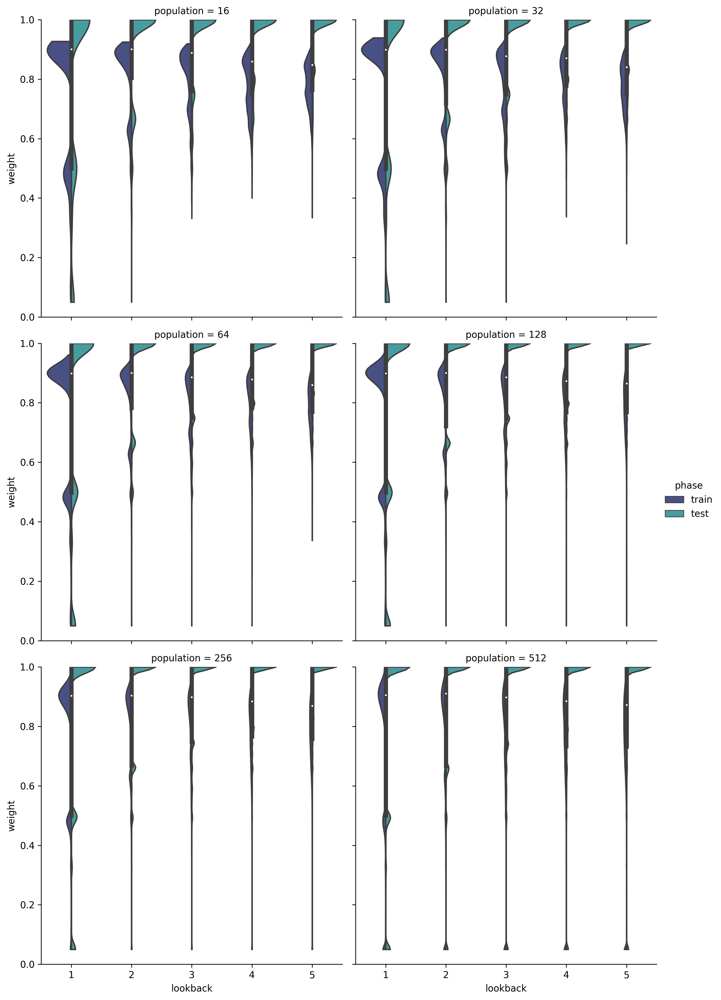

In [6]:
sns.catplot(
    data=weight_df,
    x="lookback",
    y="weight",
    hue="phase",
    col="population",
    palette="mako",
    col_wrap=2,
    kind="violin",
    cut=0,
    split=True,  # bw=.15,
)

plt.ylim(0.0, 1.0)

Text(0.5, 0, 'Weights')

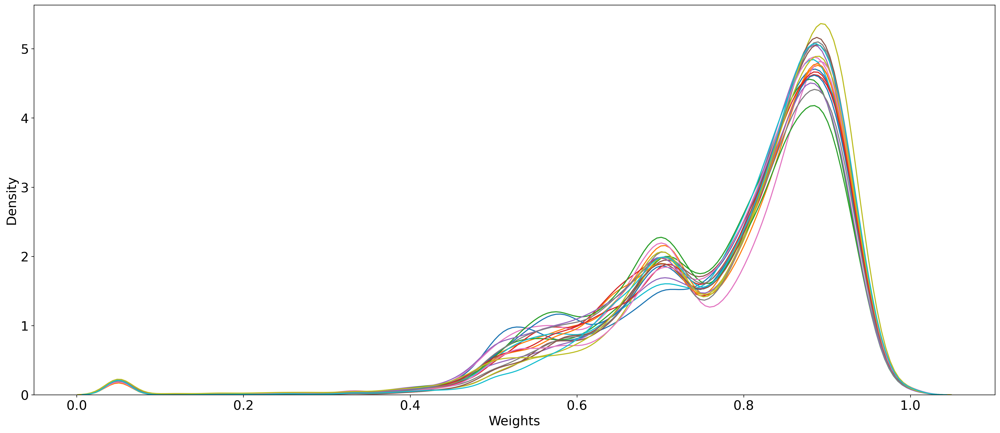

In [22]:
for weights, peaks in zip(
    data["train_weights"][(256, 3, 0.1)], data["train_peaks"][(256, 3, 0.1)]
):
    sns.kdeplot(np.array(weights).ravel())

# plt.title("Weight Distributions of 20 Runs (training phase, population=256, lookback=3, epsilon=0.1)")
plt.xlabel("Weights")

Text(0.5, 0, 'Weights')

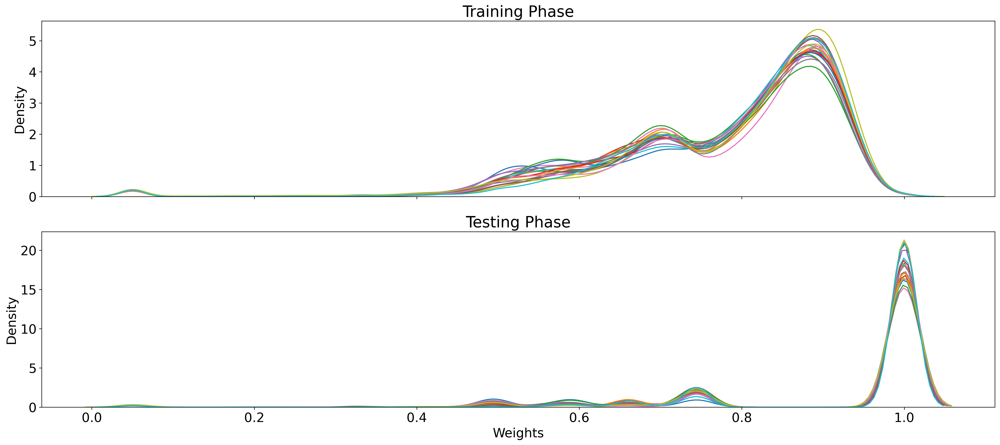

In [23]:
fig, (ax1, ax2) = plt.subplots(2, sharex=True)

ax1.set_title("Training Phase")
ax2.set_title("Testing Phase")

for weights in data["train_weights"][(256, 3, 0.1)]:
    sns.kdeplot(np.array(weights).ravel(), ax=ax1)

for weights in data["test_weights"][(256, 3, 0.1)]:
    sns.kdeplot(np.array(weights).ravel(), ax=ax2)

plt.xlabel("Weights")

In [28]:
train_weights = []
test_weights = []

for weights in data["train_weights"][(256, 3, 0.1)]:
    train_weights.extend([w for w in np.array(weights).ravel() if w >= 0])

for weights in data["test_weights"][(256, 3, 0.1)]:
    test_weights.extend([w for w in np.array(weights).ravel() if w >= 0])


r = np.arange(-0.2, 1.2, 0.001)

train_kernel = gaussian_kde(train_weights)
train_peaks, _ = find_peaks(train_kernel(r), height=0.25, prominence=(0.03, None))

test_kernel = gaussian_kde(test_weights)
test_peaks, _ = find_peaks(test_kernel(r), height=0.25, prominence=(0.03, None))

print(train_peaks, test_peaks)

[ 250  905 1089] [ 250  695  790  861  945 1200]


Text(0.5, 0, 'Weights')

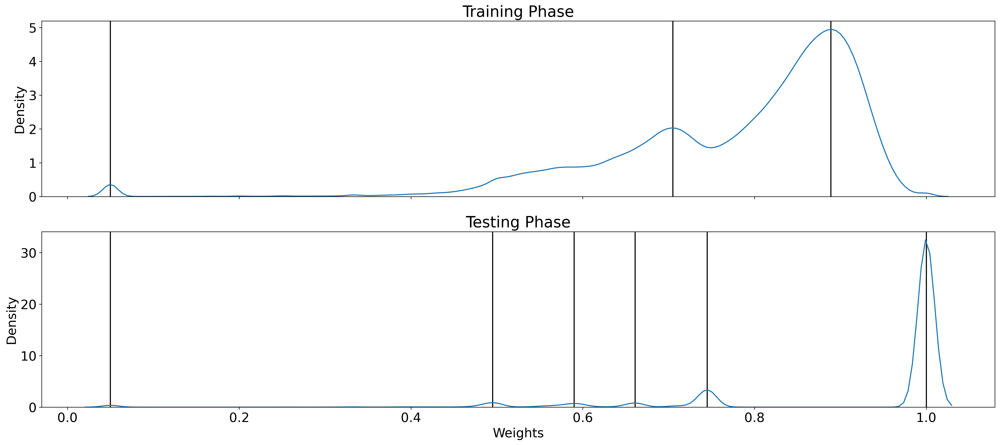

In [33]:
fig, (ax1, ax2) = plt.subplots(2, sharex=True)

ax1.set_title("Training Phase")
ax2.set_title("Testing Phase")

for peak in r[train_peaks]:
    ax1.axvline(x=peak, color="black")

for peak in r[test_peaks]:
    ax2.axvline(x=peak, color="black")

sns.kdeplot(train_weights, ax=ax1)
sns.kdeplot(test_weights, ax=ax2)

plt.xlabel("Weights")

In [3]:
reward_df = pd.DataFrame(
    [
        ["train", population, lb, reward]
        for (population, lb, t), rewards in data["train_mean_reward"].items()
        for reward in rewards
    ]
    + [
        ["test", population, lb, reward]
        for (population, lb, t), rewards in data["test_mean_reward"].items()
        for reward in rewards
    ],
    columns=["phase", "population", "lookback", "mean_reward"],
)

reward_df

,phase,population,lookback,mean_reward
0,train,16,1,2.829153
1,train,16,1,2.742863
2,train,16,1,2.812103
3,train,16,1,2.818366
4,train,16,1,2.895728
...,...,...,...,...
1195,test,512,5,2.968583
1196,test,512,5,2.976201
1197,test,512,5,2.975120
1198,test,512,5,2.975940


In [5]:
agg_df = reward_df.groupby(["phase", "population", "lookback"]).agg(
    {"mean_reward": ["mean", "std"]}
)

agg_df

mean_reward          
                                 mean       std
phase population lookback                      
test  16         1           2.887351  0.083560
                 2           2.965837  0.020589
                 3           2.971221  0.018681
                 4           2.966477  0.022685
                 5           2.974316  0.025694
      32         1           2.872729  0.069033
                 2           2.957180  0.016753
                 3           2.959277  0.026176
                 4           2.975970  0.016319
                 5           2.968700  0.015382
      64         1           2.878532  0.044286
                 2           2.960236  0.020138
                 3           2.969425  0.012912
                 4           2.974076  0.011096
                 5           2.976400  0.008559
      128        1           2.880290  0.030599
                 2           2.958108  0.011241
                 3           2.964800  0.013316
                 4           2.970160  0.009988
                 5           2.977011  0.006570
      256        1           2.891475  0.014040
                 2           2.955182  0.008404
                 3           2.969137  0.006419
                 4           2.973040  0.005104
                 5           2.975159  0.004439
      512        1           2.906906  0.012117
                 2           2.960973  0.005769
                 3           2.967662  0.004248
                 4           2.972057  0.004073
                 5           2.974718  0.003941
train 16         1           2.863261  0.049801
                 2           2.889185  0.025975
                 3           2.882920  0.021437
                 4           2.869875  0.021647
                 5           2.869263  0.015349
      32         1           2.860772  0.033545
                 2           2.883204  0.015036
                 3           2.871038  0.023321
                 4           2.875963  0.013249
                 5           2.867352  0.010204
      64         1           2.858045  0.032422
                 2           2.886866  0.015715
                 3           2.878417  0.010855
                 4           2.881766  0.011729
                 5           2.874704  0.008396
      128        1           2.862558  0.018353
                 2           2.884195  0.011104
                 3           2.878894  0.010160
                 4           2.878056  0.008110
                 5           2.875579  0.005994
      256        1           2.872674  0.009066
                 2           2.885995  0.007951
                 3           2.884314  0.006009
                 4           2.881019  0.005520
                 5           2.875790  0.004277
      512        1           2.881181  0.006421
                 2           2.892038  0.005137
                 3           2.886707  0.003927
                 4           2.883889  0.003742
                 5           2.880151  0.003143

In [6]:
pivoted_df = (
    agg_df.reset_index()
    .pivot(["phase", "population"], columns="lookback")
    .reset_index()
)

pivoted_df

C:\Users\jerem\AppData\Local\Temp/ipykernel_23844/913573291.py:1: FutureWarning: In a future version of pandas all arguments of DataFrame.pivot will be keyword-only.
  pivoted_df = agg_df.reset_index().pivot(["phase", "population"], columns="lookback").reset_index()


phase population mean_reward                                \
                                  mean                                 
lookback                             1         2         3         4   
0          test         16    2.887351  2.965837  2.971221  2.966477   
1          test         32    2.872729  2.957180  2.959277  2.975970   
2          test         64    2.878532  2.960236  2.969425  2.974076   
3          test        128    2.880290  2.958108  2.964800  2.970160   
4          test        256    2.891475  2.955182  2.969137  2.973040   
5          test        512    2.906906  2.960973  2.967662  2.972057   
6         train         16    2.863261  2.889185  2.882920  2.869875   
7         train         32    2.860772  2.883204  2.871038  2.875963   
8         train         64    2.858045  2.886866  2.878417  2.881766   
9         train        128    2.862558  2.884195  2.878894  2.878056   
10        train        256    2.872674  2.885995  2.884314  2.881019   
11        train        512    2.881181  2.892038  2.886707  2.883889   

                                                                      
                         std                                          
lookback         5         1         2         3         4         5  
0         2.974316  0.083560  0.020589  0.018681  0.022685  0.025694  
1         2.968700  0.069033  0.016753  0.026176  0.016319  0.015382  
2         2.976400  0.044286  0.020138  0.012912  0.011096  0.008559  
3         2.977011  0.030599  0.011241  0.013316  0.009988  0.006570  
4         2.975159  0.014040  0.008404  0.006419  0.005104  0.004439  
5         2.974718  0.012117  0.005769  0.004248  0.004073  0.003941  
6         2.869263  0.049801  0.025975  0.021437  0.021647  0.015349  
7         2.867352  0.033545  0.015036  0.023321  0.013249  0.010204  
8         2.874704  0.032422  0.015715  0.010855  0.011729  0.008396  
9         2.875579  0.018353  0.011104  0.010160  0.008110  0.005994  
10        2.875790  0.009066  0.007951  0.006009  0.005520  0.004277  
11        2.880151  0.006421  0.005137  0.003927  0.003742  0.003143

In [7]:
for _, row in pivoted_df[pivoted_df["phase"] == "train"].iterrows():
    print(
        row["population"][0],
        *(
            f"${mean:.3f} \pm {std:.3f}$"
            for mean, std in zip(
                row["mean_reward"]["mean"],
                row["mean_reward"]["std"],
            )
        ),
        sep="\t&\t",
        end=" \\\\\n",
    )

16	&	$2.863 \pm 0.050$	&	$2.889 \pm 0.026$	&	$2.883 \pm 0.021$	&	$2.870 \pm 0.022$	&	$2.869 \pm 0.015$ \\
32	&	$2.861 \pm 0.034$	&	$2.883 \pm 0.015$	&	$2.871 \pm 0.023$	&	$2.876 \pm 0.013$	&	$2.867 \pm 0.010$ \\
64	&	$2.858 \pm 0.032$	&	$2.887 \pm 0.016$	&	$2.878 \pm 0.011$	&	$2.882 \pm 0.012$	&	$2.875 \pm 0.008$ \\
128	&	$2.863 \pm 0.018$	&	$2.884 \pm 0.011$	&	$2.879 \pm 0.010$	&	$2.878 \pm 0.008$	&	$2.876 \pm 0.006$ \\
256	&	$2.873 \pm 0.009$	&	$2.886 \pm 0.008$	&	$2.884 \pm 0.006$	&	$2.881 \pm 0.006$	&	$2.876 \pm 0.004$ \\
512	&	$2.881 \pm 0.006$	&	$2.892 \pm 0.005$	&	$2.887 \pm 0.004$	&	$2.884 \pm 0.004$	&	$2.880 \pm 0.003$ \\


In [8]:
for _, row in pivoted_df[pivoted_df["phase"] == "test"].iterrows():
    print(
        row["population"][0],
        *(
            f"${mean:.3f} \pm {std:.3f}$"
            for mean, std in zip(
                row["mean_reward"]["mean"],
                row["mean_reward"]["std"],
            )
        ),
        sep="\t&\t",
        end=" \\\\\n",
    )

16	&	$2.887 \pm 0.084$	&	$2.966 \pm 0.021$	&	$2.971 \pm 0.019$	&	$2.966 \pm 0.023$	&	$2.974 \pm 0.026$ \\
32	&	$2.873 \pm 0.069$	&	$2.957 \pm 0.017$	&	$2.959 \pm 0.026$	&	$2.976 \pm 0.016$	&	$2.969 \pm 0.015$ \\
64	&	$2.879 \pm 0.044$	&	$2.960 \pm 0.020$	&	$2.969 \pm 0.013$	&	$2.974 \pm 0.011$	&	$2.976 \pm 0.009$ \\
128	&	$2.880 \pm 0.031$	&	$2.958 \pm 0.011$	&	$2.965 \pm 0.013$	&	$2.970 \pm 0.010$	&	$2.977 \pm 0.007$ \\
256	&	$2.891 \pm 0.014$	&	$2.955 \pm 0.008$	&	$2.969 \pm 0.006$	&	$2.973 \pm 0.005$	&	$2.975 \pm 0.004$ \\
512	&	$2.907 \pm 0.012$	&	$2.961 \pm 0.006$	&	$2.968 \pm 0.004$	&	$2.972 \pm 0.004$	&	$2.975 \pm 0.004$ \\


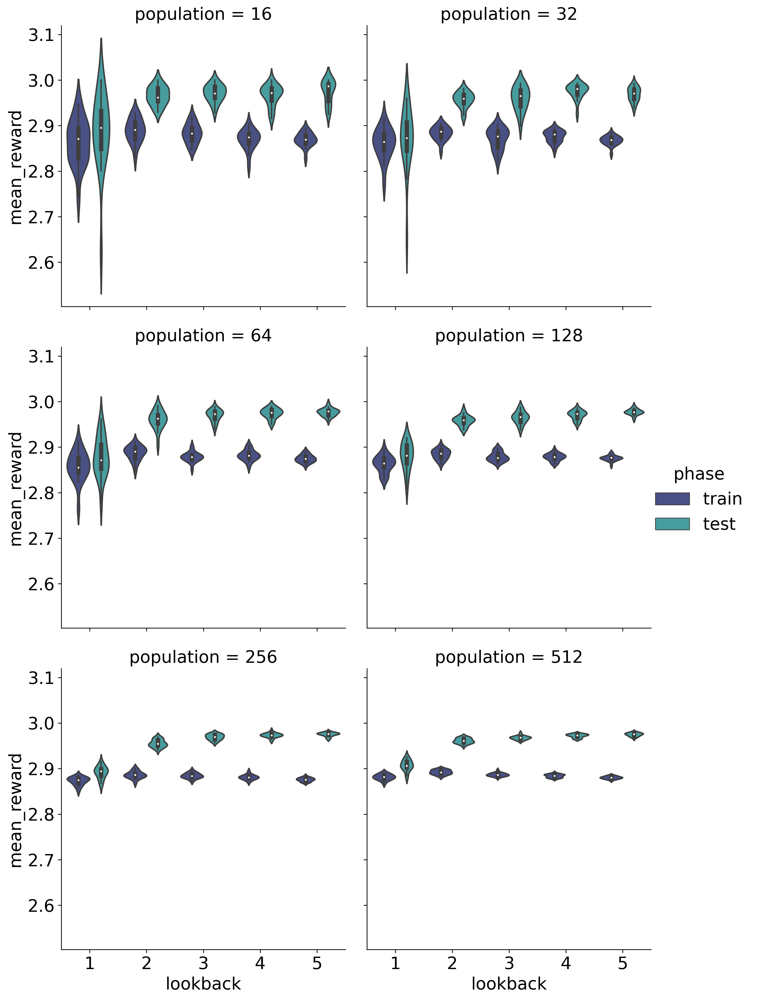

In [79]:
sns.catplot(
    reward_df,
    x="lookback",
    y="mean_reward",
    col="population",
    col_wrap=2,
    hue="phase",
    palette="mako",
    kind="violin",
)

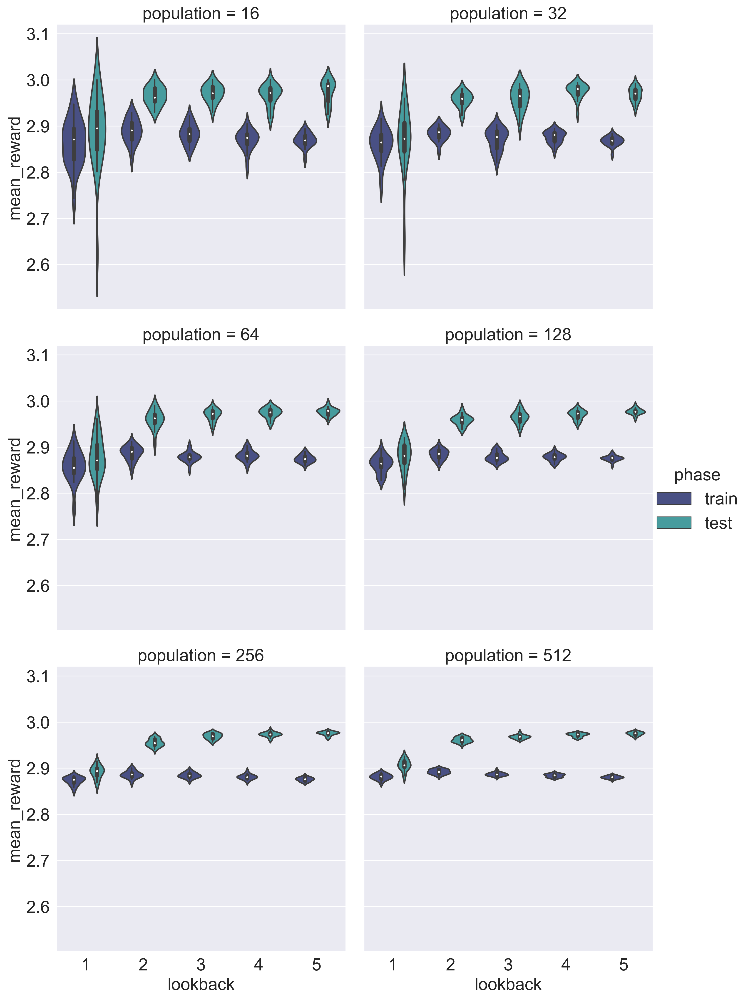

In [4]:
sns.set_style("darkgrid")

g = sns.catplot(
    reward_df,
    x="lookback",
    y="mean_reward",
    col="population",
    col_wrap=2,
    hue="phase",
    palette="mako",
    kind="violin",
)

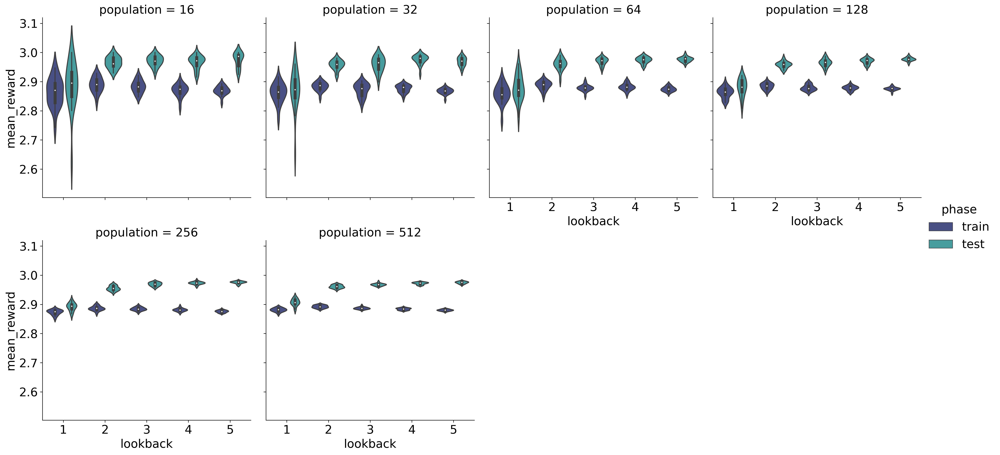

In [80]:
sns.catplot(
    reward_df,
    x="lookback",
    y="mean_reward",
    col="population",
    col_wrap=4,
    hue="phase",
    palette="mako",
    kind="violin",
)

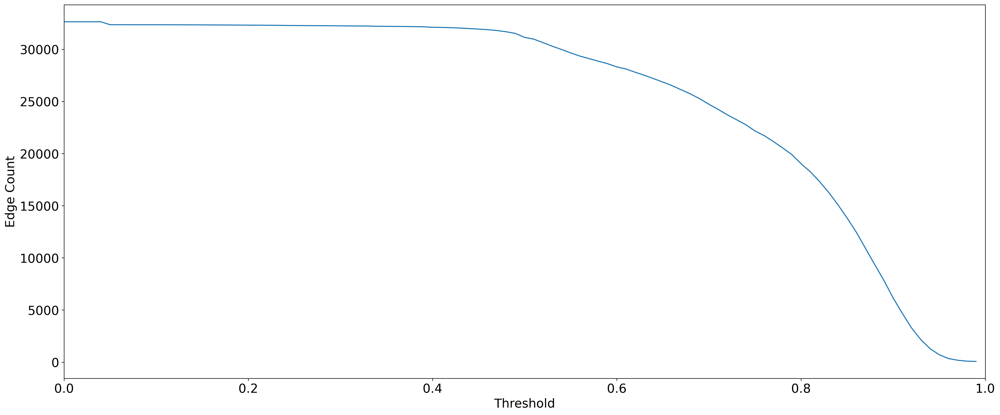

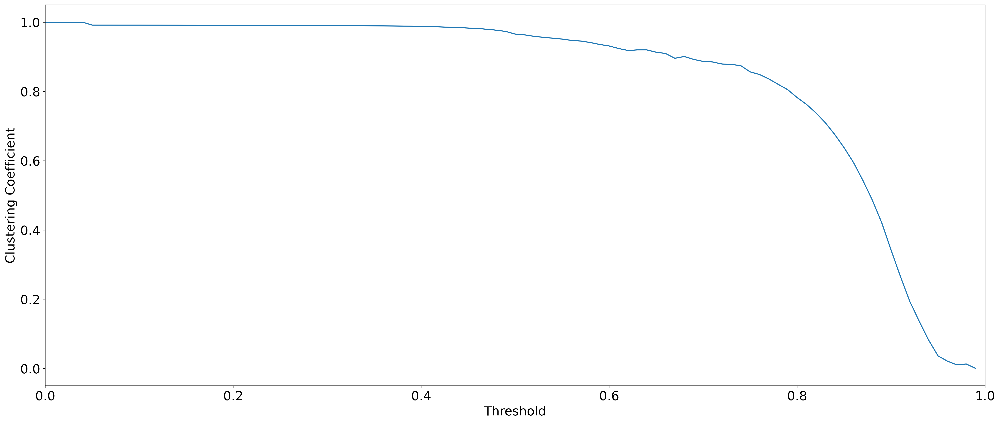

In [4]:
# THRESHOLDS = [0.99, 0.975, 0.95, 0.925, 0.9, 0.875, 0.85, 0.825, 0.8, 0.7, 0.6, 0.5, 0.4, 0.3, 0.2, 0.1]

# THRESHOLDS = [0.975, 0.95, 0.925, 0.9]

THRESHOLDS = [t / 100 for t in reversed(range(100))]

Gs, edge_counts, clustering_coefficients = get_graphs_at_thresholds(
    data["train_weights"][(256, 3, 0.1)][0], THRESHOLDS
)

plt.xlim(left=0, right=1)
plt.xlabel("Threshold")
plt.ylabel("Edge Count")
plt.plot(THRESHOLDS, edge_counts)
plt.show()

plt.xlim(left=0, right=1)
plt.xlabel("Threshold")
plt.ylabel("Clustering Coefficient")
plt.plot(THRESHOLDS, clustering_coefficients)
plt.show()

In [6]:
THRESHOLDS = [0.975, 0.95, 0.925, 0.9]
Gs, edge_counts, clustering_coefficients = get_graphs_at_thresholds(
    data["train_weights"][(256, 3, 0.1)][0], THRESHOLDS
)

fig = plt.figure(constrained_layout=True, figsize=(24, 24))
subfigures = fig.subfigures(len(THRESHOLDS) // 2, 2)

for threshold, G, subfig in zip(THRESHOLDS, Gs, subfigures.flat):
    plot_degree_distribution(
        G, f"Connected Graph Components (threshold={threshold})", subfig
    )

In [8]:
THRESHOLDS = [0.99, 0.98, 0.97, 0.96, 0.95, 0.94]
Gs, edge_counts, clustering_coefficients = get_graphs_at_thresholds(
    data["train_weights"][(256, 3, 0.1)][0], THRESHOLDS
)

fig = plt.figure(constrained_layout=True, figsize=(24, 24))
subfigures = fig.subfigures(len(THRESHOLDS) // 2, 2)

for threshold, G, subfig in zip(THRESHOLDS, Gs, subfigures.flat):
    plot_degree_distribution(
        G, f"Connected Graph Components (threshold={threshold})", subfig
    )

In [7]:
THRESHOLDS = [0.975, 0.95, 0.925, 0.9]
Gs, edge_counts, clustering_coefficients = get_graphs_at_thresholds(
    data["test_weights"][(256, 3, 0.1)][0], THRESHOLDS
)

fig = plt.figure(constrained_layout=True, figsize=(24, 24))
subfigures = fig.subfigures(len(THRESHOLDS) // 2, 2)

for threshold, G, subfig in zip(THRESHOLDS, Gs, subfigures.flat):
    plot_degree_distribution(
        G, f"Connected Graph Components (threshold={threshold})", subfig
    )